# Filtrado de imágenes digitales
## Fundamentos de Análisis de Imágenes

- Nombre 1: Ada Moral Merino
- Nombre 2: Lucía Martinez Miramontes
- Nombre 3: Laura García González

## Objetivos

Los objetivos de esta práctica son:
* Repasar algunos conceptos de filtrado de imágenes y programar algunas rutinas para suavizado y extracción de bordes.

En esta práctica se usarán varias funciones de filtrado de imágenes disponibles en OpenCV: https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

Vamos a usar las imágenes ``escgaus.bmp`` y ``escimp5.bmp`` de la carpeta ``img_pi``.
Estas imágenes están contaminadas respectivamente con ruido de tipo gaussiano e impulsional:

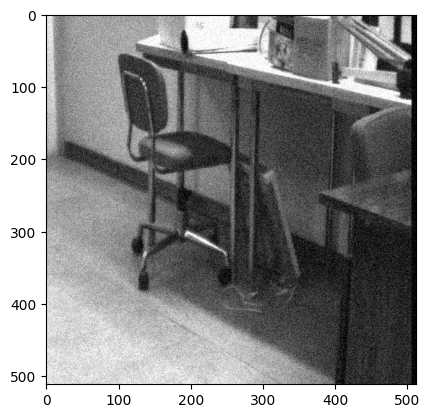

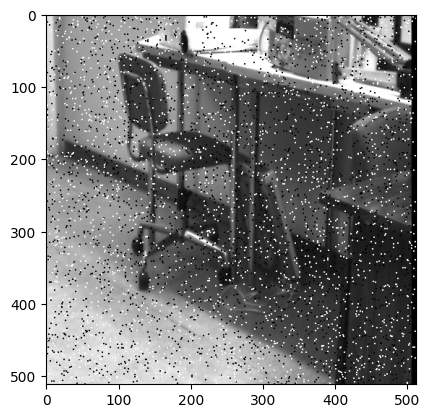

In [2]:
img_gauss = cv2.imread('img_pi/escgaus.bmp', cv2.IMREAD_GRAYSCALE)
img_imp = cv2.imread('img_pi/escimp5.bmp', cv2.IMREAD_GRAYSCALE)

plt.imshow(img_gauss, cmap='gray')
plt.show()
plt.imshow(img_imp, cmap='gray')
plt.show()

**Ejercicio 1**: escribe una función ``mask_gauss(n, sigma)``
que construya una máscara de una dimensión de un filtro
gaussiano de tamaño *n* y varianza σ. Filtra las imágenes
anteriores con filtros gaussianos bidimensionales de diferentes tamaños
de *n*, y/o σ, usando la función [``cv2.filter2D``](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04) de OpenCV.

En este ejercicio tenéis que implementar vosotros la función que construye la máscara. No podéis usar funciones que construyan la máscara o realicen el filtrado automáticamente, pero podéis comparar el resultado de vuestra función con el de la función [``cv2.GaussianBlur``](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1) de OpenCV para comprobar que coinciden. Muestra cómo afecta este filtrado a los dos tipos de ruido que contaminan las imágenes anteriores y discute los resultados. Usa la función ``draw_mask`` para visualizar la máscara utilizada.

**Nota**: tal y como aparece en la documentación de OpenCV, la función ``cv2.filter2D``realiza una correlación en lugar de una convolución. Para lograr el mismo efecto que una convolución, se debe aplicar la función [``np.flip``](https://numpy.org/doc/stable/reference/generated/numpy.flip.html) de Numpy a la máscara antes de llamar a la función.

In [3]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

def draw_mask(mask):
    """Pinta una maścara 2D."""
    n = mask.shape[0]
    lim = (n - 1) // 2
    xs = ys = np.arange(-lim, lim + 1)
    xs, ys = np.meshgrid(xs, ys)
    
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.plot_surface(xs, ys, mask, cmap=cm.coolwarm, linewidth=0, antialiased=False)
    plt.show()

In [4]:
def mask_gauss(n, sigma):
    """
    Construye una máscara gaussiana unidimensional de tamaño n y desviación sigma.
    """
    if n % 2 == 0:
        raise ValueError("n debe ser impar")
    
    lim = n // 2
    x = np.arange(-lim, lim+1)
    mask = np.exp(-(x**2)/(2*sigma**2))
    mask /= mask.sum() 
    return mask



 -> Aplicando convolución con n=3, sigma=0.5


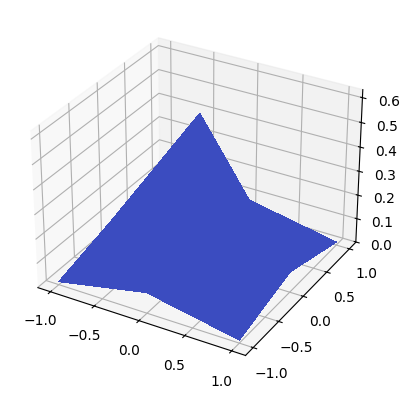

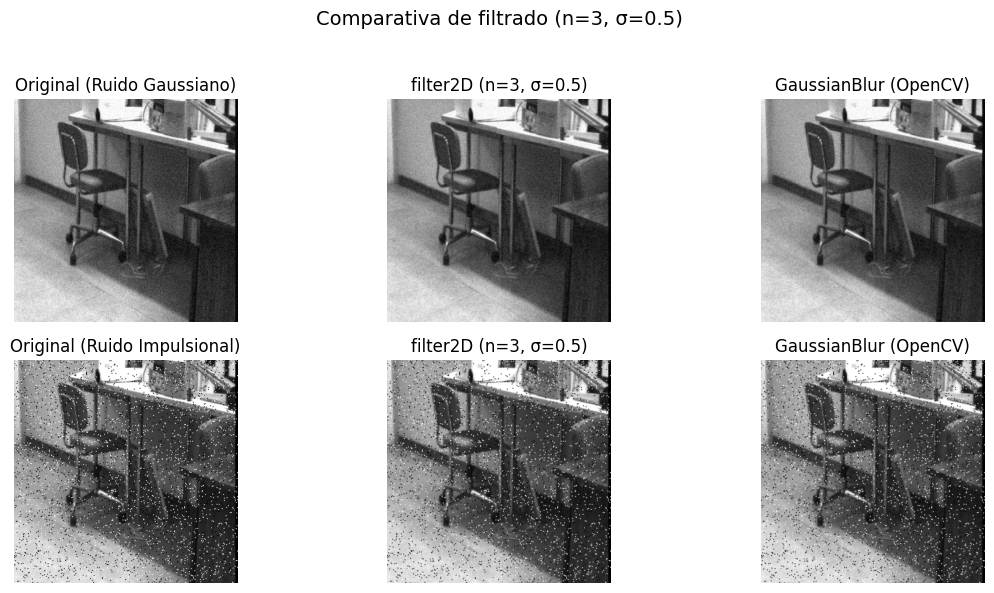


 -> Aplicando convolución con n=3, sigma=1.0


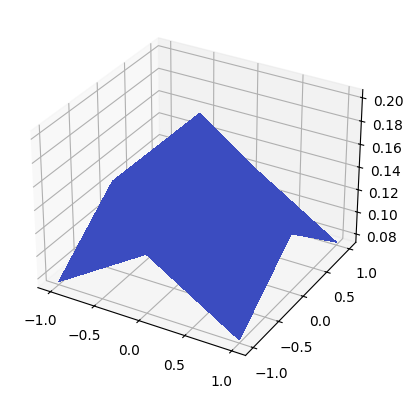

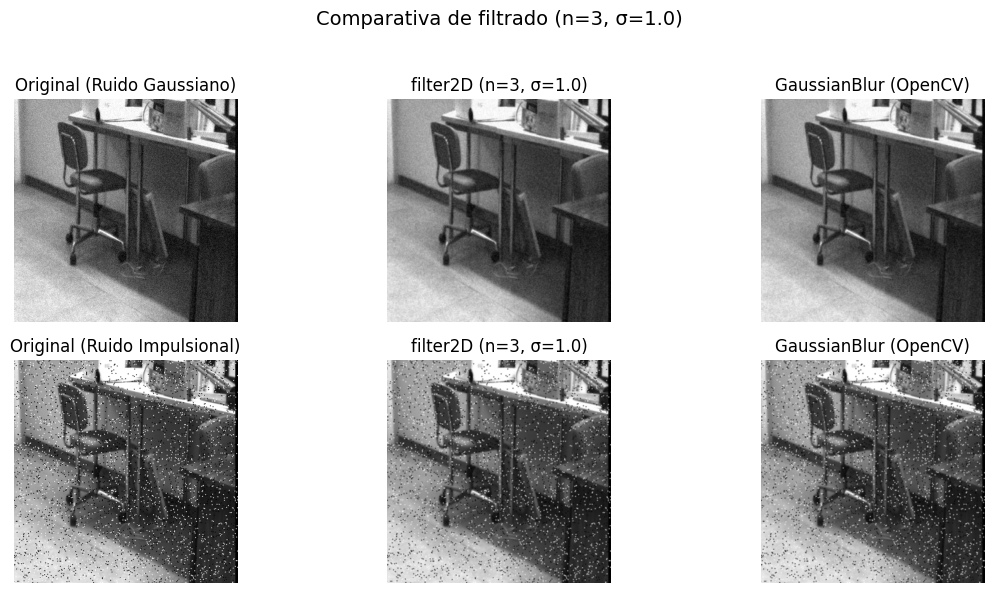


 -> Aplicando convolución con n=3, sigma=5


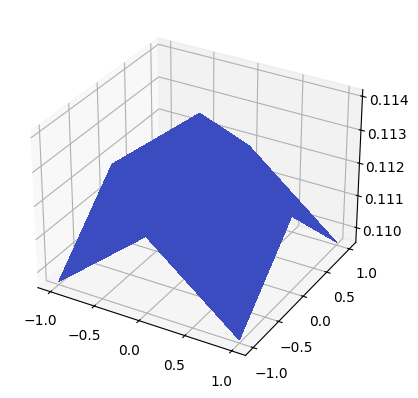

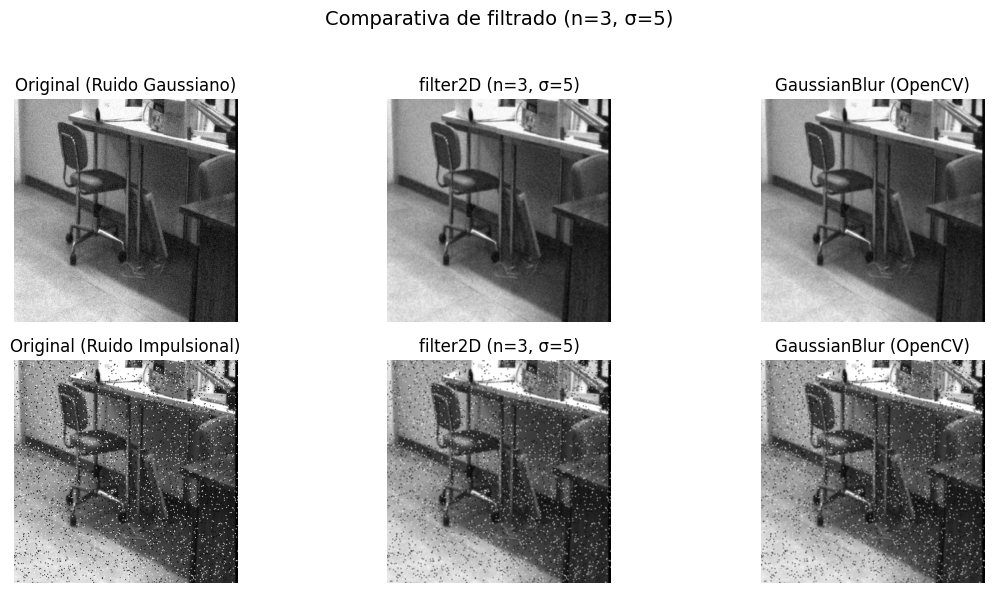


 -> Aplicando convolución con n=7, sigma=0.5


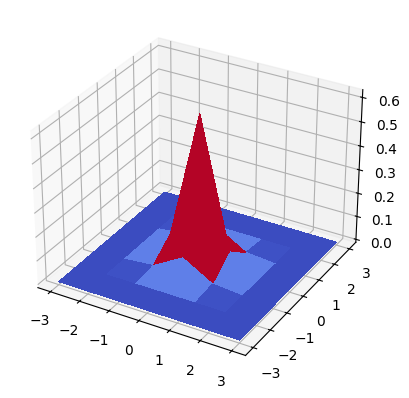

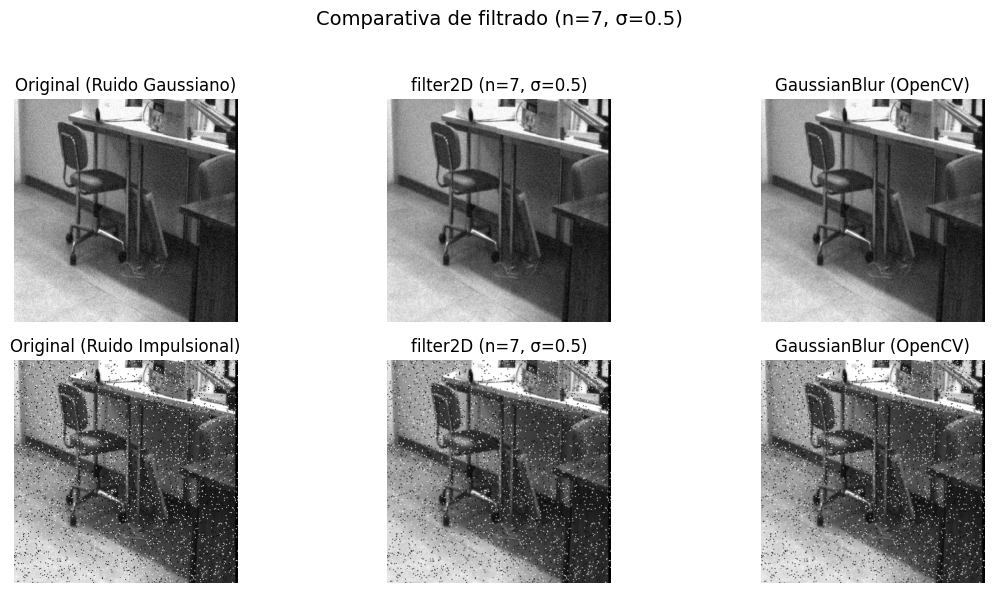


 -> Aplicando convolución con n=7, sigma=1.0


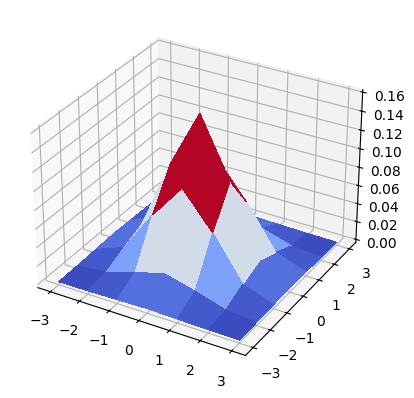

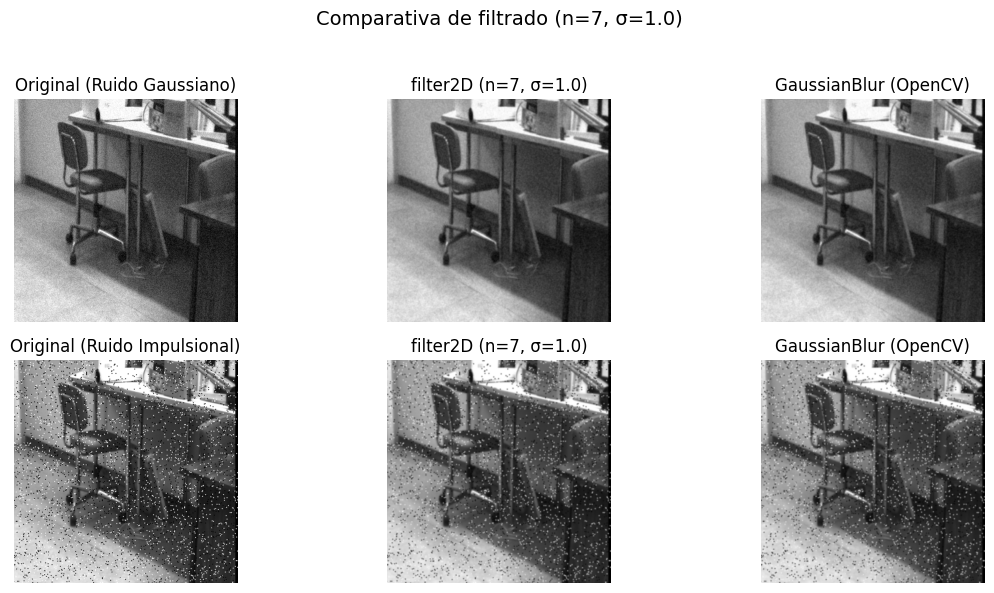


 -> Aplicando convolución con n=7, sigma=5


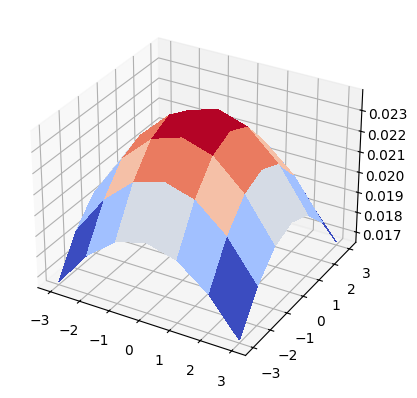

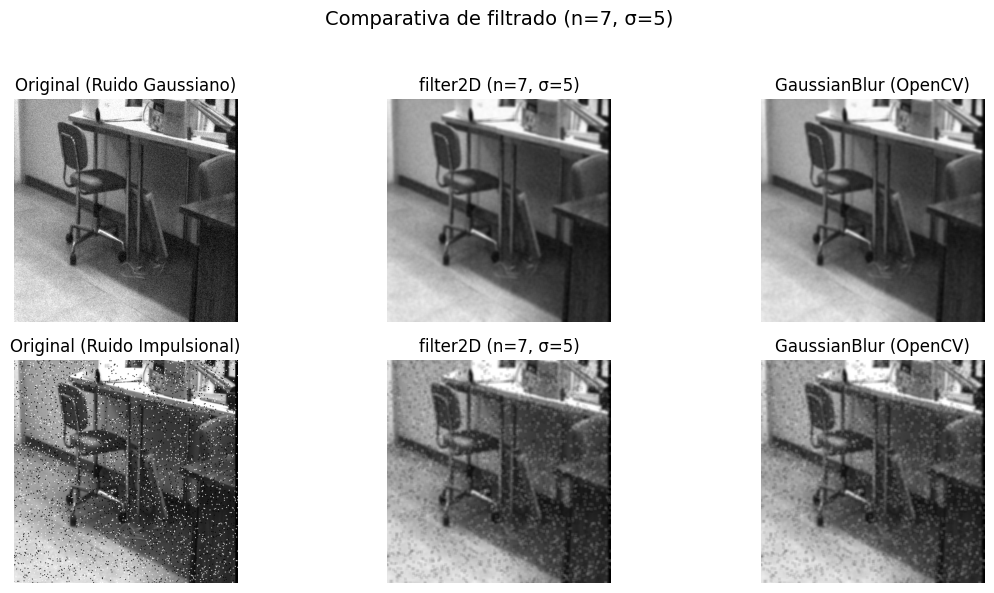


 -> Aplicando convolución con n=15, sigma=0.5


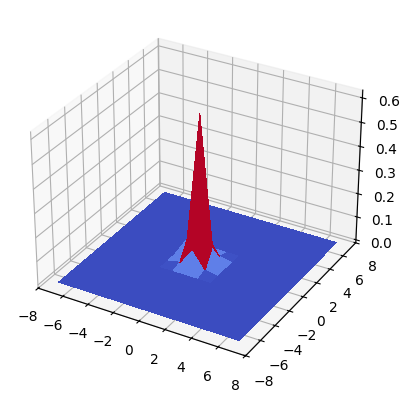

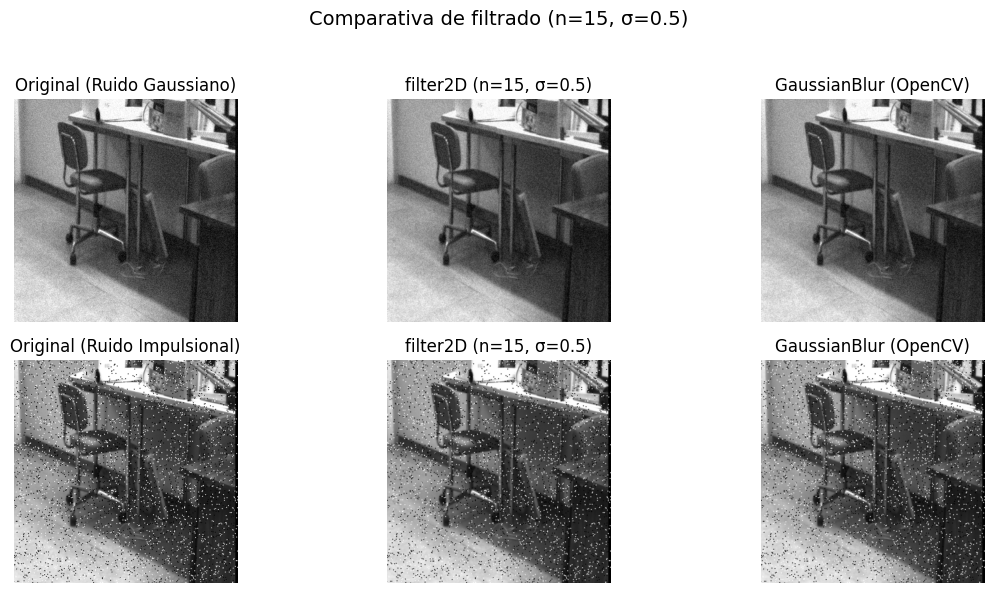


 -> Aplicando convolución con n=15, sigma=1.0


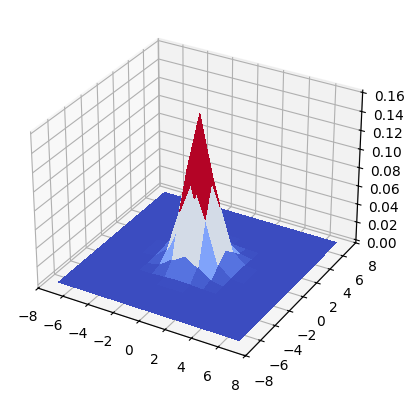

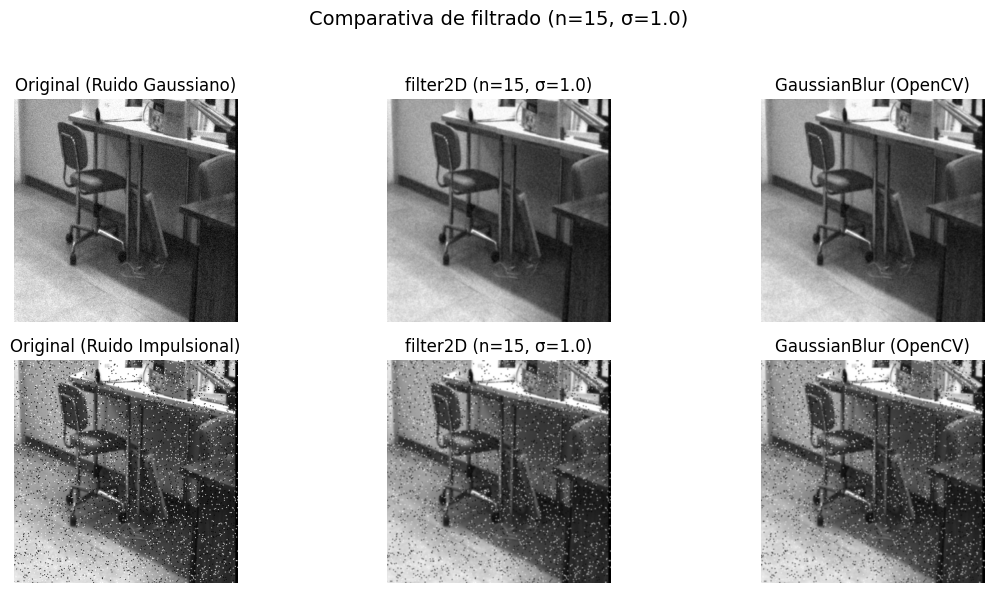


 -> Aplicando convolución con n=15, sigma=5


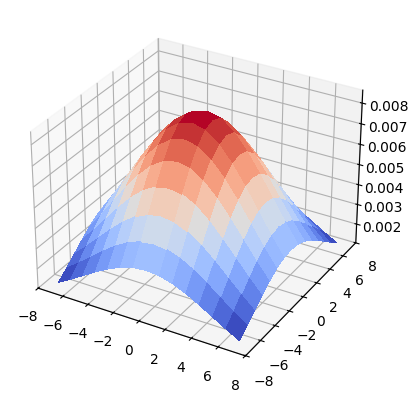

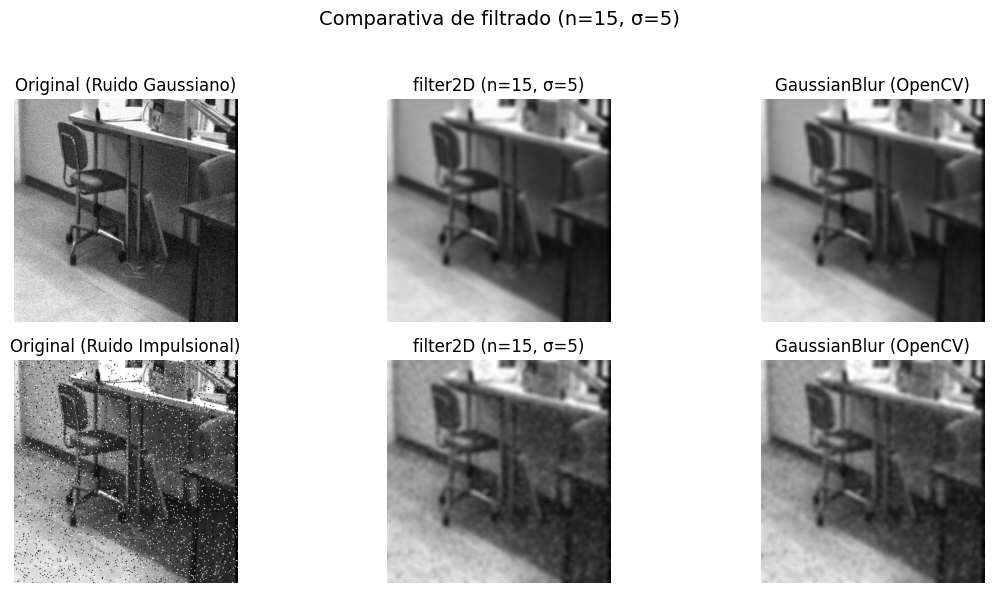


 -> Aplicando convolución con n=25, sigma=0.5


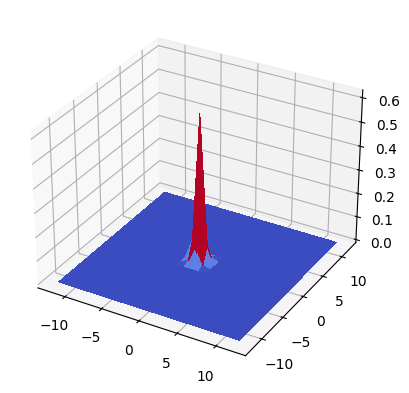

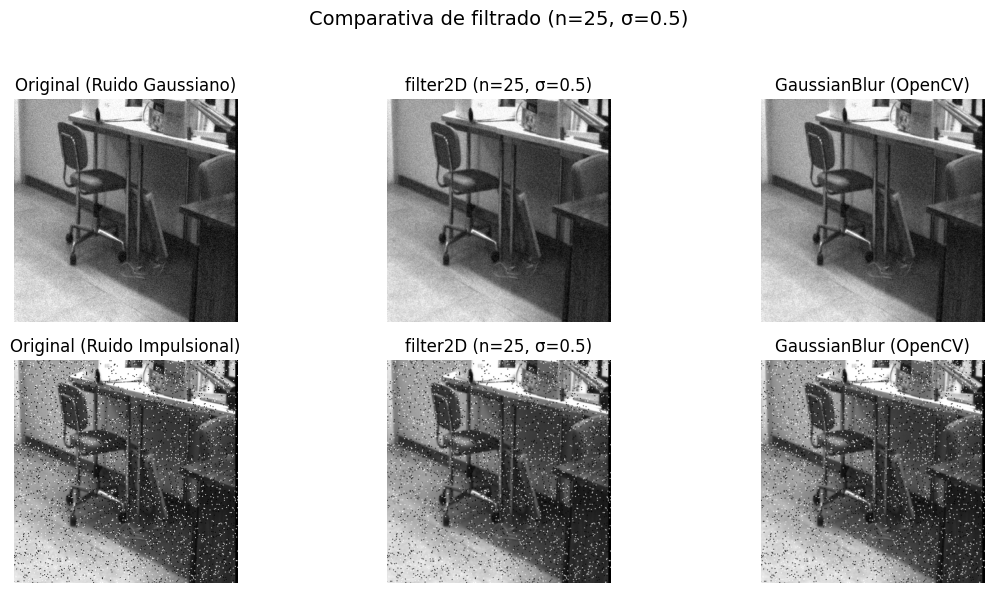


 -> Aplicando convolución con n=25, sigma=1.0


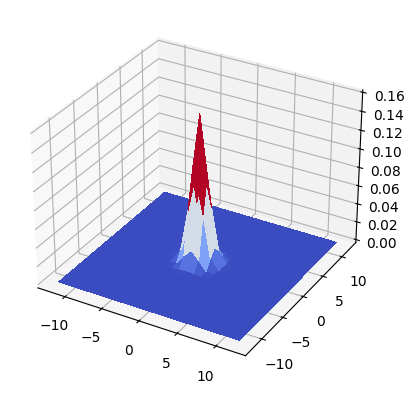

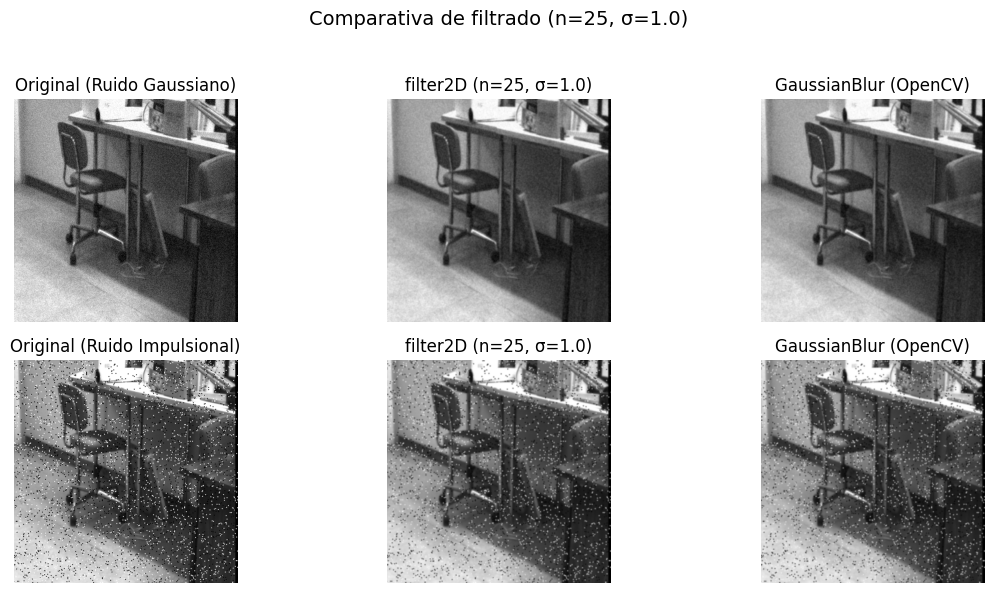


 -> Aplicando convolución con n=25, sigma=5


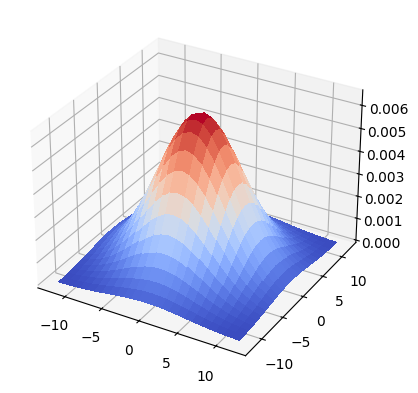

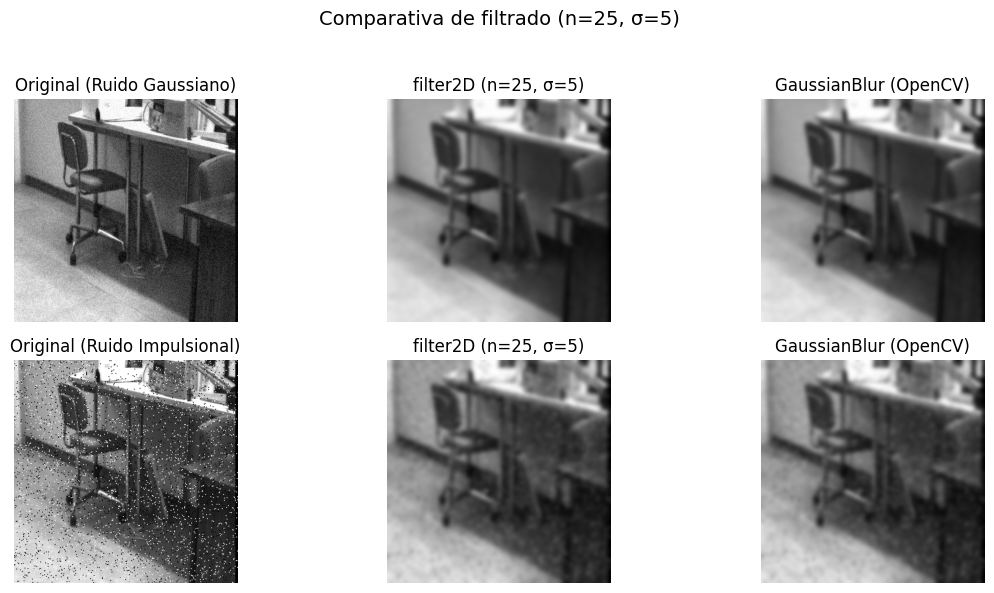


 -> Aplicando convolución con n=31, sigma=0.5


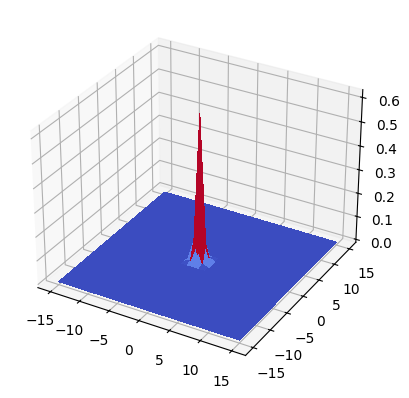

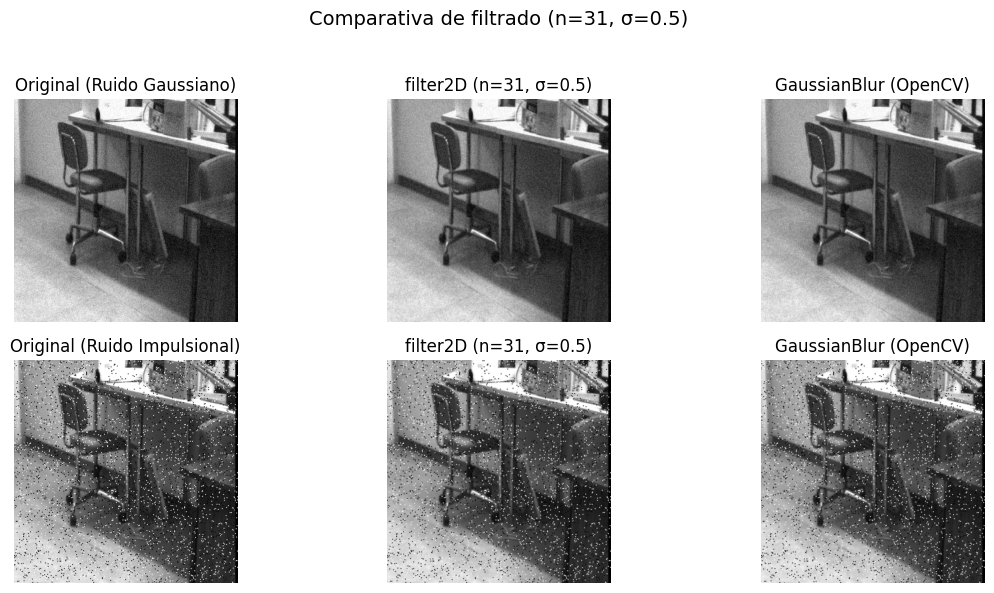


 -> Aplicando convolución con n=31, sigma=1.0


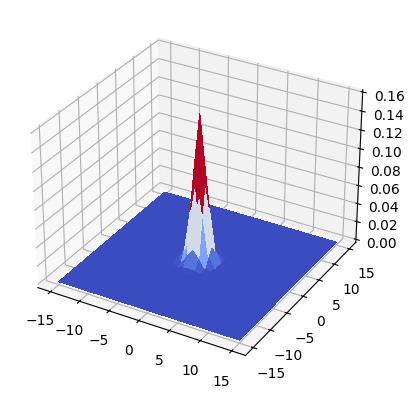

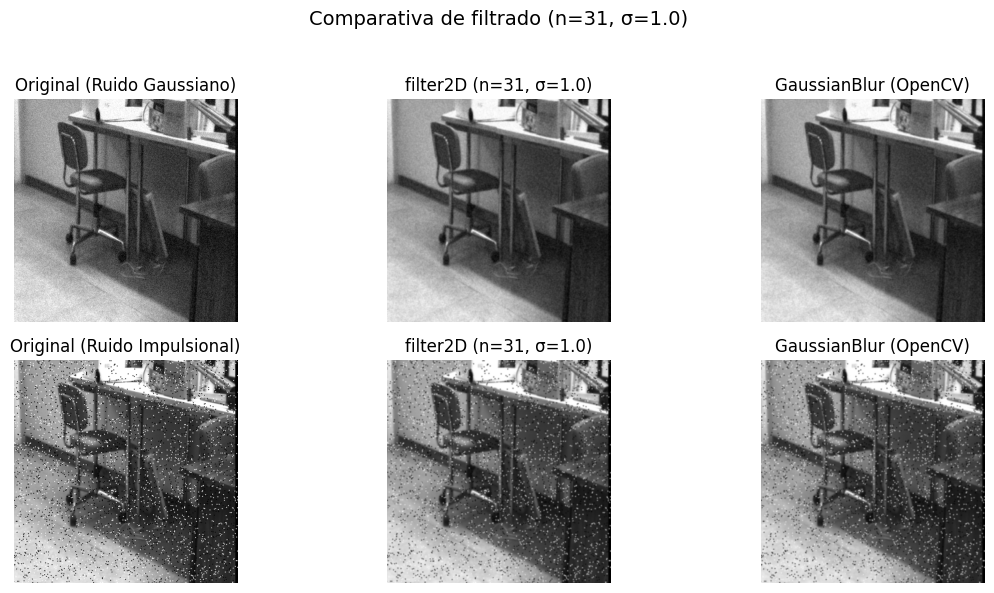


 -> Aplicando convolución con n=31, sigma=5


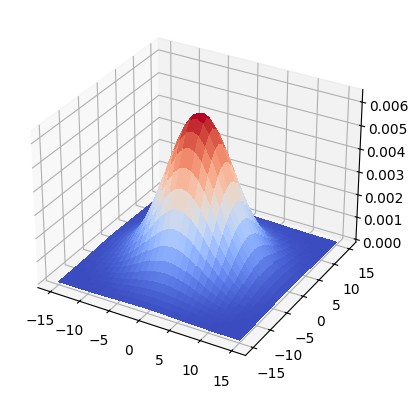

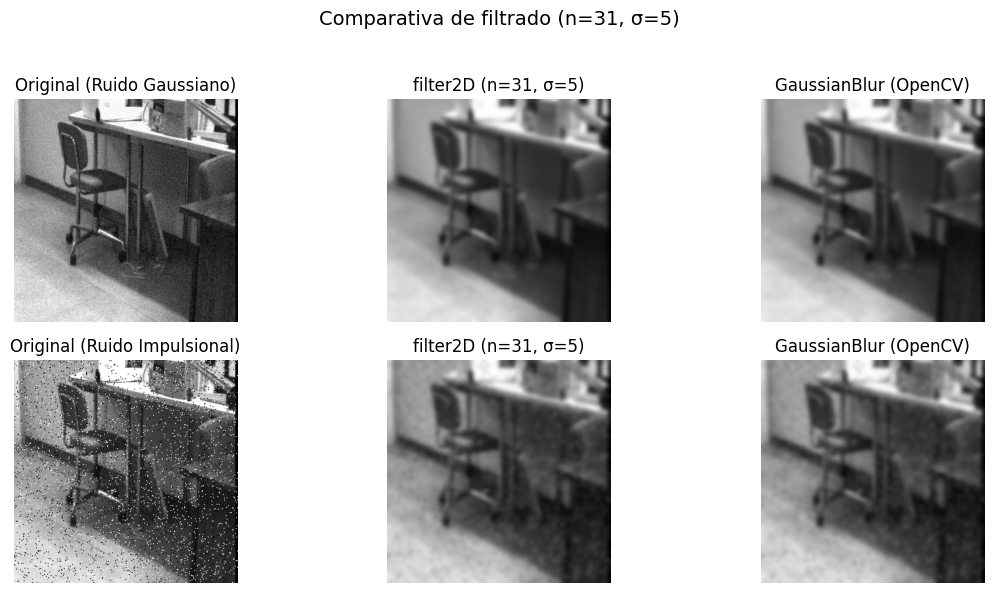

In [5]:

if img_gauss is None or img_imp is None:
    raise ValueError("No se pudieron cargar las imágenes desde la carpeta img_pi")

img_gauss_f = img_gauss.astype(np.float32)
img_imp_f   = img_imp.astype(np.float32)



n_values = [3, 7, 15, 25, 31]
sigma_values = [0.5, 1.0, 5]

for n in n_values:
    for sigma in sigma_values:
        print(f"\n -> Aplicando convolución con n={n}, sigma={sigma}")

        mask_1d = mask_gauss(n, sigma)
        mask_2d = np.outer(mask_1d, mask_1d).astype(np.float32)
        mask_2d_flipped = np.flip(mask_2d)
        draw_mask(mask_2d_flipped)

        # Filtrado filter2D
        filtrada_gauss = cv2.filter2D(img_gauss_f, -1, mask_2d_flipped)
        filtrada_imp   = cv2.filter2D(img_imp_f, -1, mask_2d_flipped)

        filtrada_gauss = cv2.normalize(filtrada_gauss, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        filtrada_imp   = cv2.normalize(filtrada_imp,   None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

        # Comparar con GaussianBlur de OpenCV
        blur_gauss = cv2.GaussianBlur(img_gauss, (n, n), sigmaX=sigma)
        blur_imp   = cv2.GaussianBlur(img_imp, (n, n), sigmaX=sigma)


        plt.figure(figsize=(12, 6))
        # Ruido Gaussiano
        plt.subplot(2, 3, 1)
        plt.imshow(img_gauss, cmap='gray')
        plt.title('Original (Ruido Gaussiano)')
        plt.axis('off')

        plt.subplot(2, 3, 2)
        plt.imshow(filtrada_gauss, cmap='gray')
        plt.title(f'filter2D (n={n}, σ={sigma})')
        plt.axis('off')

        plt.subplot(2, 3, 3)
        plt.imshow(blur_gauss, cmap='gray')
        plt.title('GaussianBlur (OpenCV)')
        plt.axis('off')

        # Ruido Impulsional
        plt.subplot(2, 3, 4)
        plt.imshow(img_imp, cmap='gray')
        plt.title('Original (Ruido Impulsional)')
        plt.axis('off')

        plt.subplot(2, 3, 5)
        plt.imshow(filtrada_imp, cmap='gray')
        plt.title(f'filter2D (n={n}, σ={sigma})')
        plt.axis('off')

        plt.subplot(2, 3, 6)
        plt.imshow(blur_imp, cmap='gray')
        plt.title('GaussianBlur (OpenCV)')
        plt.axis('off')

        plt.suptitle(f"Comparativa de filtrado (n={n}, σ={sigma})", fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


**Ejercicio 2**: estudio del comportamiento del filtro de suavizado gaussiano en comparación con el filtro tipo caja. 

Toma la imagen ``grid`` generada debajo y fíltrala con filtros del gaussiano de sigma creciente,  $\sigma=[0.1,2,4,40]$, ``cv2.GaussianBlur(grid.astype('f'), ksize=(31, 31),sigmaX = 2,sigmaY=0)``. Muestra los resultados. 

Filtra nuevamente la misma imagen con un filtro tipo caja grande, por ejemplo 31x31, ``grid_fil = cv2.boxFilter(grid.astype('f'),ddepth=-1,ksize=(31,31))``. Muestra la imagen filtrada.

Compara y discute los resultados obtenidos

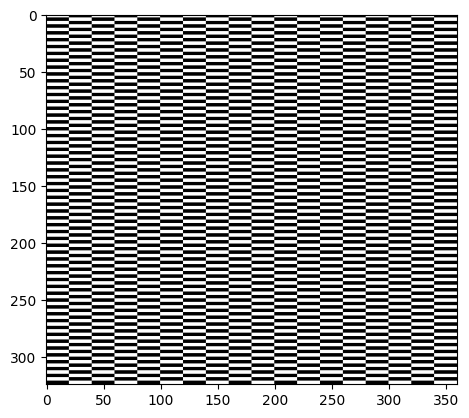

In [6]:
# Generamos la imagen 
U = np.array([[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1],[1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1], [1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1]], dtype = np.uint8)
Z = U * 0
bl = np.block([[U,Z,U,Z,U,Z],[Z,U,Z,U,Z,U],[U,Z,U,Z,U,Z],[Z,U,Z,U,Z,U],[U,Z,U,Z,U,Z],[Z,U,Z,U,Z,U]])
bll = np.block([[bl,bl,bl],[bl,bl,bl],[bl,bl,bl],[bl,bl,bl],[bl,bl,bl],[bl,bl,bl]])
grid = np.block([[bll],[bll],[bll]])
plt.imshow(grid, cmap='gray')
plt.show()

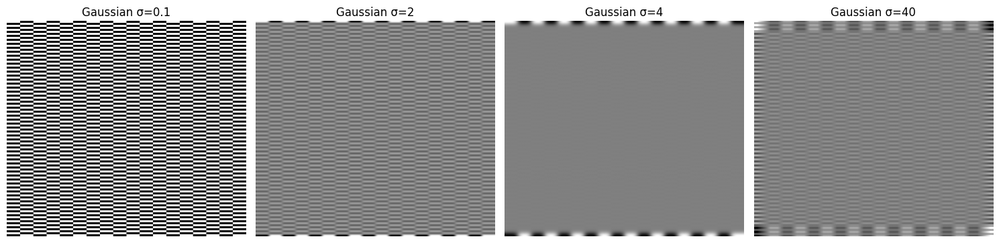

In [7]:
# Filtro Gaussiano
sigmas = [0.1, 2, 4, 40]

plt.figure(figsize=(15,5))
for i, sigma in enumerate(sigmas):
    grid_gauss = cv2.GaussianBlur(grid.astype(np.float32), ksize=(31, 31), sigmaX=sigma, sigmaY=0)
    plt.subplot(1, len(sigmas), i+1)
    plt.imshow(grid_gauss, cmap='gray')
    plt.title(f'Gaussian σ={sigma}')
    plt.axis('off')
plt.tight_layout()
plt.show()


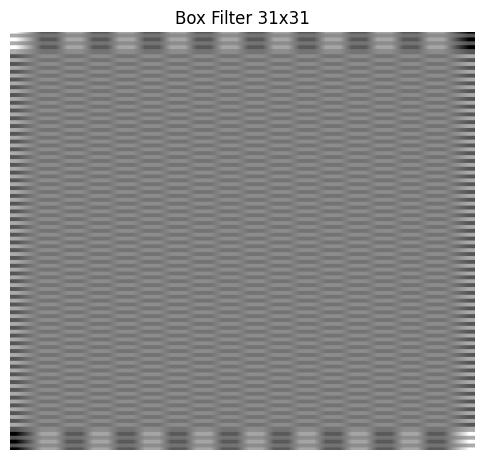

In [16]:
# Filtro tipo caja
grid_box = cv2.boxFilter(grid.astype(np.float32), ddepth=-1, ksize=(31,31))

plt.figure(figsize=(6,6))
plt.imshow(grid_box, cmap='gray')
plt.title('Box Filter 31x31')
plt.axis('off')
plt.show()

El filtro tipo caja de tamaño grande (31×31) produce un resultado prácticamente equivalente al de un filtro gaussiano con σ muy alto (≈40). Ambos eliminan completamente los detalles finos de la imagen y generan un desenfoque extremo. La diferencia teórica radica en que el filtro gaussiano pondera más los píxeles cercanos al centro, mientras que el tipo caja los promedia por igual; sin embargo, a nivel visual, cuando la ventana es tan grande, ambos comportamientos se vuelven casi indistinguibles.

**Ejercicio 3**: escribe una función ``mask_deriv_gauss(n, sigma)`` que construya una máscara de una dimensión de un
filtro derivada del gaussiano de tamaño *n* y varianza σ. Filtra la imagen ``telefonica.jpg`` de la carpeta ``img_pi`` con filtros bidimensionales de derivada del gaussiano para extraer los bordes de la imagen. Prueba con diferentes valores de *n* y/o σ.

Muestra y discute los resultados. Pinta alguna de las máscaras construidas.

In [9]:
def mask_deriv_gauss(n, sigma):
    """
    Construye una máscara unidimensional de la derivada del gaussiano.
    n: tamaño impar de la máscara
    sigma: desviación estándar
    """
    if n % 2 == 0:
        raise ValueError("n debe ser impar")
    
    lim = n // 2
    x = np.arange(-lim, lim + 1)
    # Derivada del gaussiano
    mask = -x * np.exp(-(x**2)/(2*sigma**2)) / (sigma**2)
    # Normalización 
    mask /= np.sum(np.abs(mask))
    return mask

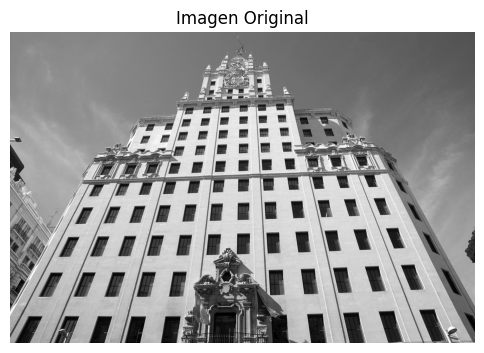

In [10]:
imagen = cv2.imread('img_pi/telefonica.jpg', cv2.IMREAD_GRAYSCALE)
if imagen is None:
    raise ValueError("No se pudo cargar la imagen. Revisa la ruta y el nombre del archivo.")

plt.figure(figsize=(6,6))
plt.imshow(imagen, cmap='gray')
plt.title('Imagen Original')
plt.axis('off')
plt.show()


n debe adaptarse a σ, la regla práctica: n ≥ 6σ + 1 para cubrir adecuadamente la gaussiana.

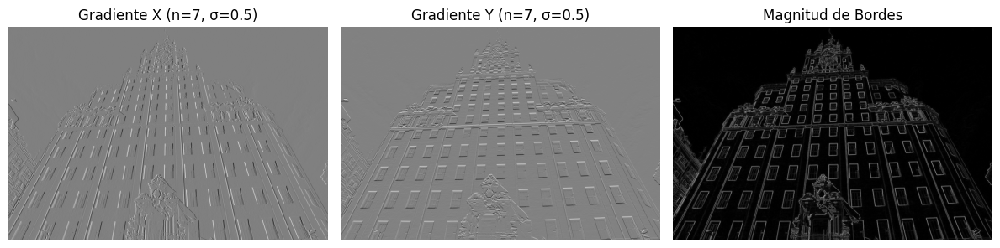

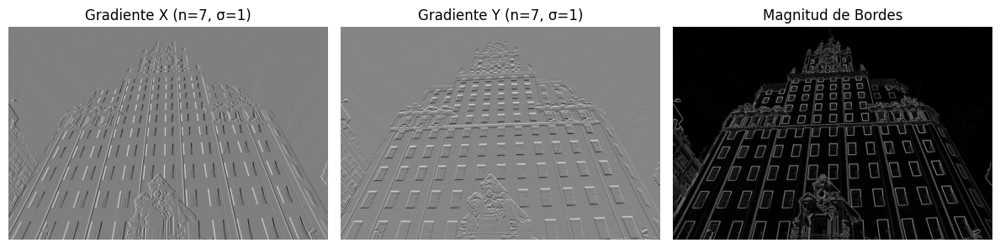

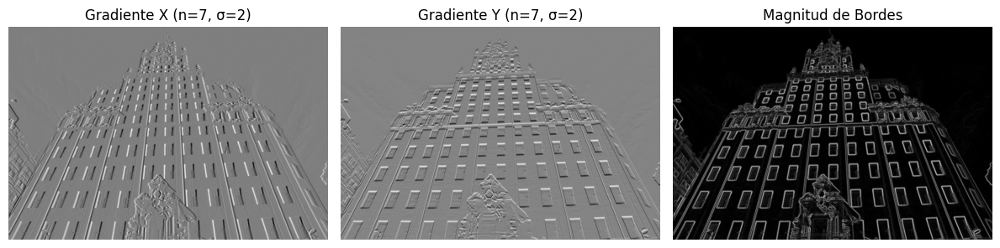

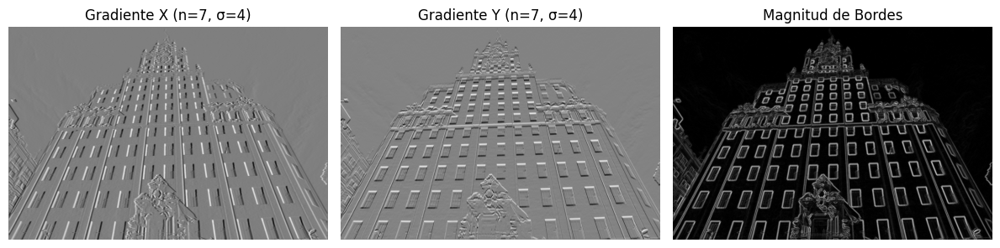

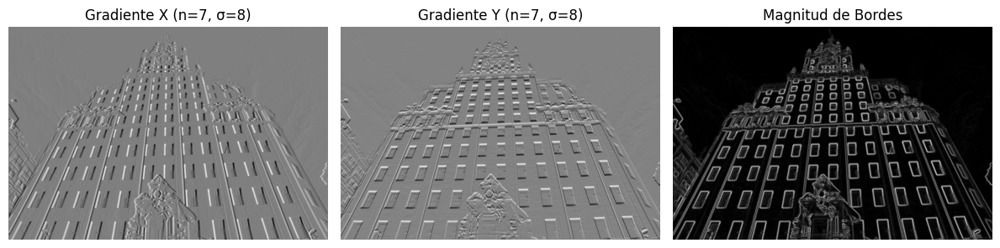

...

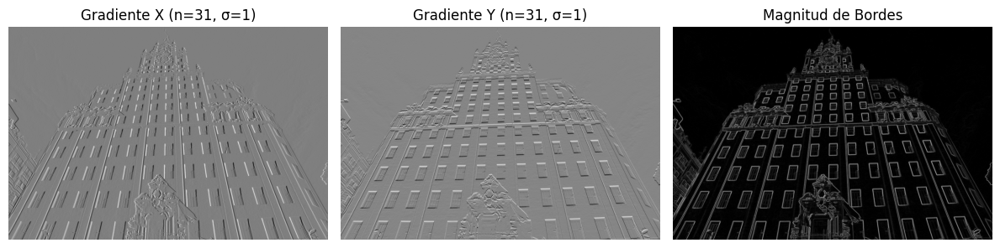

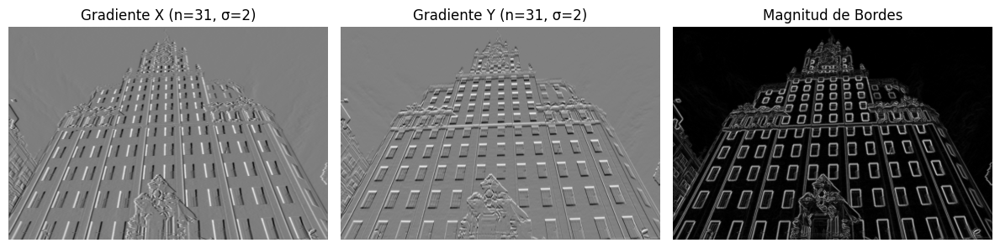

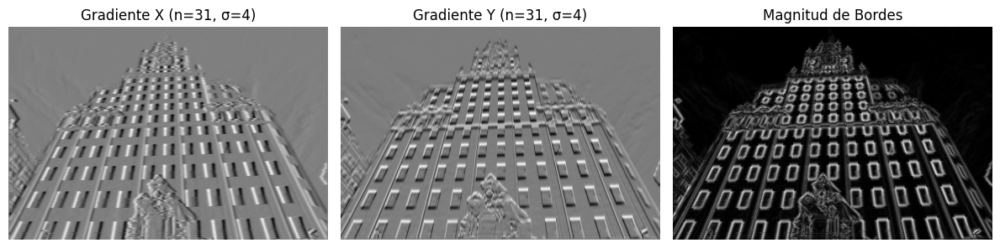

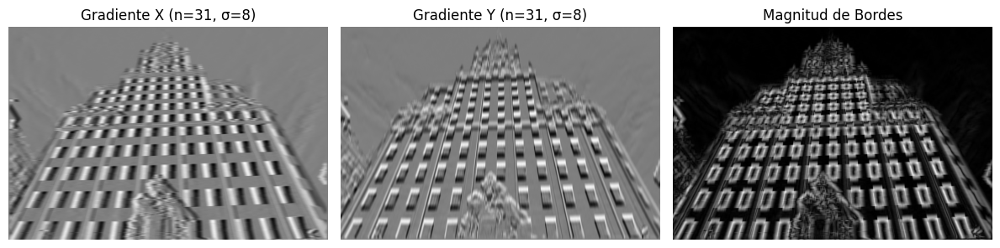

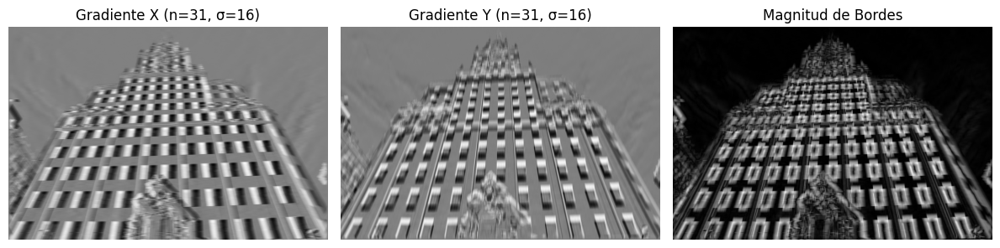

In [17]:
n_values = [7, 15, 31]
sigma_values = [0.5, 1, 2, 4, 8, 16]


for n in n_values:
    for sigma in sigma_values:
        mask_x = mask_deriv_gauss(n, sigma)
        mask_y = mask_x.reshape(-1,1)  
        
        # Filtrado bidimensional
        grad_x = cv2.filter2D(imagen.astype(np.float32), -1, mask_x.reshape(1,-1))
        grad_y = cv2.filter2D(imagen.astype(np.float32), -1, mask_y)
        
        # Magnitud del gradiente 
        bordes = np.sqrt(grad_x**2 + grad_y**2)
        bordes = cv2.normalize(bordes, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        
        plt.figure(figsize=(12,5))
        plt.subplot(1,3,1)
        plt.imshow(grad_x, cmap='gray')
        plt.title(f'Gradiente X (n={n}, σ={sigma})')
        plt.axis('off')
        
        plt.subplot(1,3,2)
        plt.imshow(grad_y, cmap='gray')
        plt.title(f'Gradiente Y (n={n}, σ={sigma})')
        plt.axis('off')
        
        plt.subplot(1,3,3)
        plt.imshow(bordes, cmap='gray')
        plt.title('Magnitud de Bordes')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()


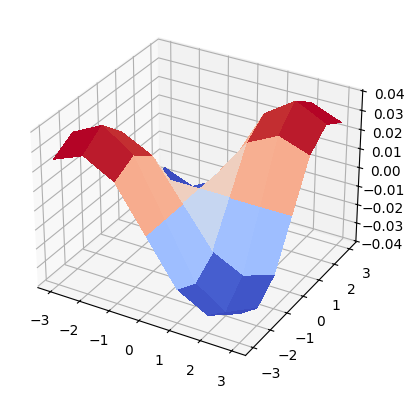

In [12]:
mask_ejemplo = mask_deriv_gauss(7, 2)
draw_mask(np.outer(mask_ejemplo, mask_ejemplo))

El parámetro σ controla el grosor y suavidad de los bordes, mientras que n debe elegirse para representar correctamente la máscara.
Valores intermedios de σ con n adecuado permiten un balance entre nitidez y suavidad, resaltando los bordes principales de la imagen sin amplificar el ruido.
Valores extremos de σ producen bordes demasiado finos o demasiado difusos, y n insuficiente genera truncamiento en la máscara.

**Ejercicio 4**: utiliza la función [``cv2.medianBlur``](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga564869aa33e58769b4469101aac458f9) de OpenCV que realice el filtrado de la imagen con un filtro de la mediana de tamaño *n* × *n*.

Muestra y discute los resultados para diferentes valores del parámetro *n* en ambas imágenes. Compáralos con los obtenidos en el Ejercicio 1.

In [13]:
# Cargar imágenes del profe
img_gauss = cv2.imread('img_pi/escgaus.bmp', cv2.IMREAD_GRAYSCALE)
img_imp   = cv2.imread('img_pi/escimp5.bmp', cv2.IMREAD_GRAYSCALE)

if img_gauss is None or img_imp is None:
    raise ValueError("No se pudieron cargar las imágenes de img_pi")

ruido_gauss = img_gauss.copy()
ruido_sp = img_imp.copy()

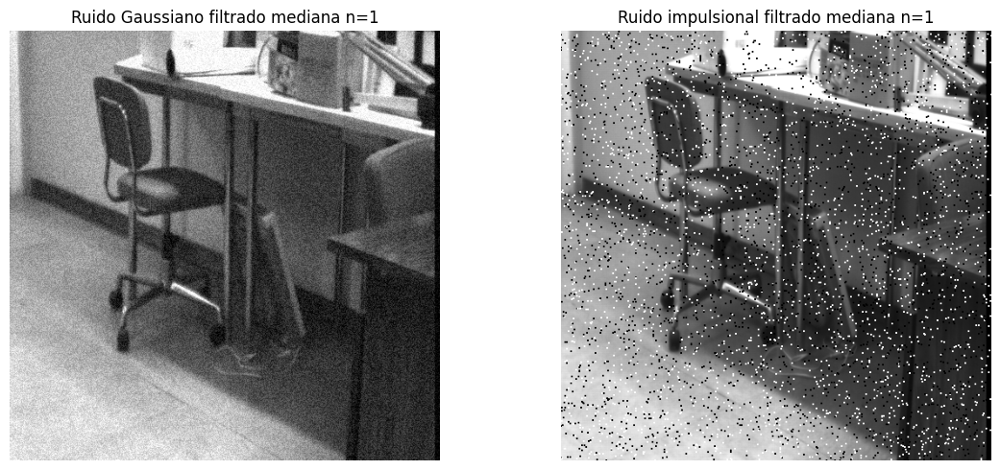

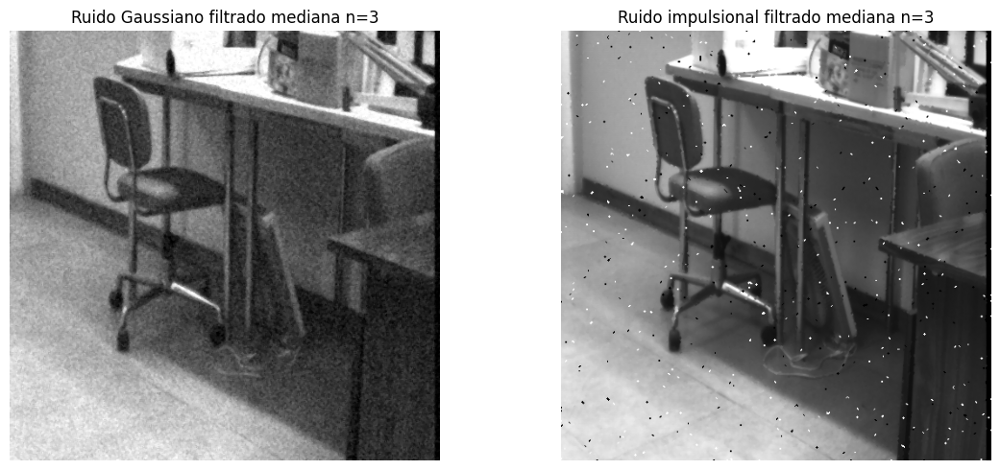

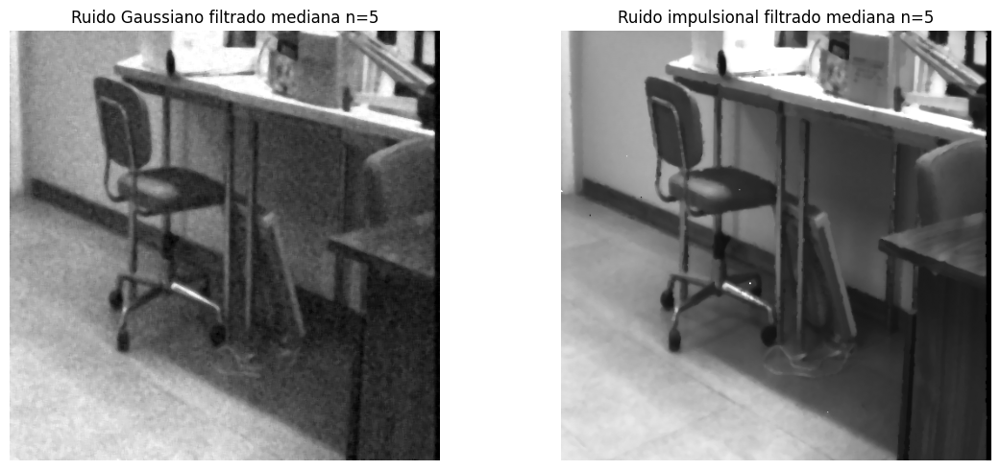

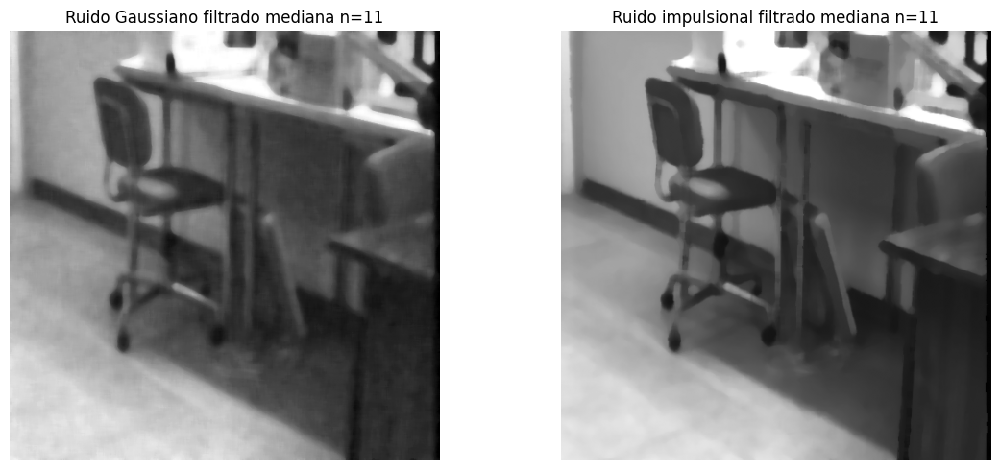

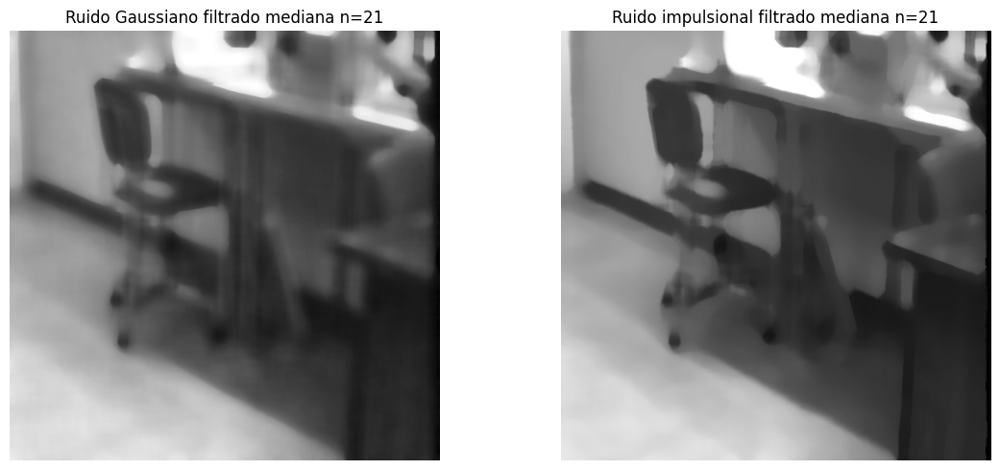

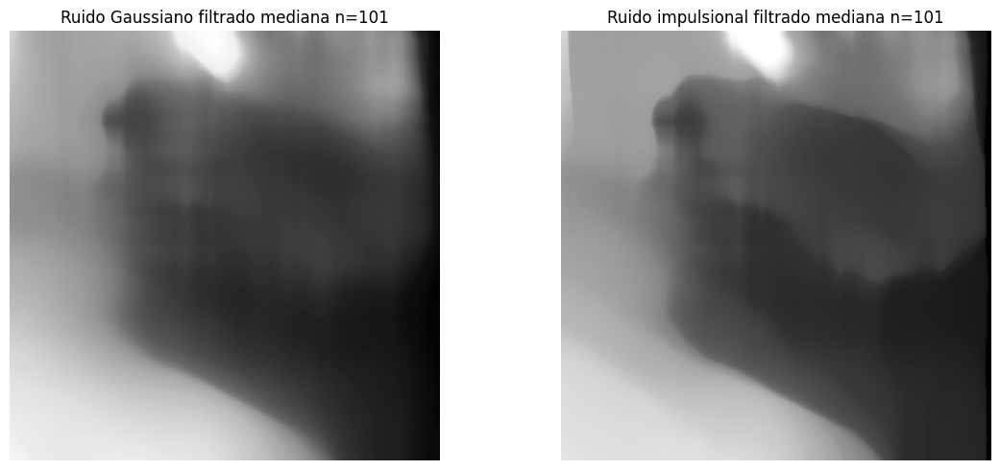

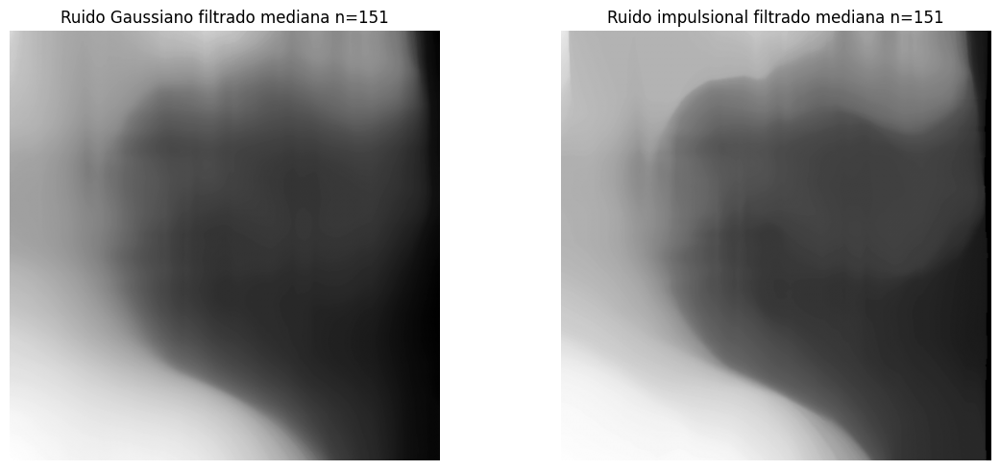

In [14]:
n_values = [1, 3, 5, 11, 21, 101, 151]

for n in n_values:
    filtrada_gauss = cv2.medianBlur(ruido_gauss, n)
    filtrada_sp = cv2.medianBlur(ruido_sp, n)
    

    plt.figure(figsize=(12,5))
    
    plt.subplot(1,2,1)
    plt.imshow(filtrada_gauss, cmap='gray')
    plt.title(f'Ruido Gaussiano filtrado mediana n={n}')
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.imshow(filtrada_sp, cmap='gray')
    plt.title(f'Ruido impulsional filtrado mediana n={n}')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()


En este ejercicio, la mediana con n pequeño mantiene bordes nítidos y elimina ruido, mientras que con n grande suaviza más, afectando detalles finos. Comparado con el Ejercicio 1, la mediana no detecta bordes por sí misma, pero limpia la imagen eliminando el ruido sin difuminar los bordes importantes. Esto hace que la detección de bordes y líneas con Canny y Hough sea más precisa y que las estructuras principales se mantengan nítidas.